**Notebook Overview**

Hello, All! I am herewith presenting my new notebook **which I tailored around a self-devised theme – 'How a data analyst sees the Israeli-Palestinian conflicts'.** 

A few days ago while browsing for a new dataset for my next notebook project, **I stumbled upon [this beautiful dataset](https://www.kaggle.com/datasets/willianoliveiragibin/fatalities-in-the-israeli-palestinian)**, which has a nicely compiled statistical account of conflicts occurring in Israel and Palestine since the year 2000. 

**Intrigued by the quality of the dataset, I decided to make a notebook out of the dataset.**

**The 'Israeli_Palestinian_Conflicts |Data Analyst's View' notebook aims to analyse events and fatalities by**

- *Year, month, and day of the month of events that led to fatalities*
- *Victim profiles such as age, gender, citizenship, participation in hostilities etc*
- *Event locations, location districts, and location regions*
- *Type of injury, type of ammunition, and party responsible for killings, among others.*

Analysis is made using a diverse range of plots including pie charts, histograms, scatterplots, line graphs, bar charts (vertical, horizontal, stacked, and clustered], and violin plots, among others.

**I hope you will enjoy the notebook theme, the contents in it, and the DataViz formats.**

**So let's get started and delve into our notebook.**

In [1]:
## Import the relevant libraries into the environment
import numpy as np                ## linear algebra
import pandas as pd               ## data processing, dataset file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt   ## data visualization & graphical plotting
import seaborn as sns             ## to visualize random distributions
import plotly.express as px       ## data visualization & graphical plotting
%matplotlib inline

pd.options.display.float_format = '{:.2f}'.format

import warnings                    ## Filter warnings
warnings.filterwarnings('ignore')

In [2]:
## Load the dataset 
df = pd.read_csv('/kaggle/input/fatalities-in-the-israeli-palestinian/fatalities_isr_pse_conflict_2000_to_2023.csv')

## Check a few records in the dataset that we just loaded
df.head(5)

,name,date_of_event,age,citizenship,event_location,event_location_district,event_location_region,date_of_death,gender,took_part_in_the_hostilities,place_of_residence,place_of_residence_district,type_of_injury,ammunition,killed_by,notes
0,'Abd a-Rahman Suleiman Muhammad Abu Daghash,2023-09-24,32.00,Palestinian,Nur Shams R.C.,Tulkarm,West Bank,2023-09-24,M,NaN,Nur Shams R.C.,Tulkarm,gunfire,live ammunition,Israeli security forces,Fatally shot by Israeli forces while standing ...
1,Usayed Farhan Muhammad 'Ali Abu 'Ali,2023-09-24,21.00,Palestinian,Nur Shams R.C.,Tulkarm,West Bank,2023-09-24,M,NaN,Nur Shams R.C.,Tulkarm,gunfire,live ammunition,Israeli security forces,Fatally shot by Israeli forces while trying to...
2,'Abdallah 'Imad Sa'ed Abu Hassan,2023-09-22,16.00,Palestinian,Kfar Dan,Jenin,West Bank,2023-09-22,M,NaN,al-Yamun,Jenin,gunfire,live ammunition,Israeli security forces,Fatally shot by soldiers while firing at them ...
3,Durgham Muhammad Yihya al-Akhras,2023-09-20,19.00,Palestinian,'Aqbat Jaber R.C.,Jericho,West Bank,2023-09-20,M,NaN,'Aqbat Jaber R.C.,Jericho,gunfire,live ammunition,Israeli security forces,Shot in the head by Israeli forces while throw...
4,Raafat 'Omar Ahmad Khamaisah,2023-09-19,15.00,Palestinian,Jenin R.C.,Jenin,West Bank,2023-09-19,M,NaN,Jenin,Jenin,gunfire,live ammunition,Israeli security forces,Wounded by soldiers’ gunfire after running awa...


In [3]:
## Check the dataset shape, duplicate entries, and missing values
print(f'\033[94mNumber of records/rows & features/columns in the dataset are: {df.shape[0], df.shape[1]}')
print(f'\033[94mNumber of duplicate entries in the dataset are: {df.duplicated().sum()}')
print(f'\033[94mNumber missing values in the dataset are: {sum(df.isna().sum())}')

Number of records/rows & features/columns in the dataset are: (11124, 16)
Number of duplicate entries in the dataset are: 7
Number missing values in the dataset are: 7539


- From the output, we can see that there are about 7 duplicate entries in our dataset, and over 7500 missing values are also present. We will check them and try to solve them in our next steps.

In [4]:
## Let's get rid of duplicate entries
df.drop_duplicates(keep='first',inplace=True)

## Again check the dataset shape, after removing the duplicate entries
print(f'\033[94mNumber of records/rows & features/columns in the dataset are: {df.shape[0], df.shape[1]}')
print(f'\033[94mNumber of duplicate entries in the dataset are: {df.duplicated().sum()}')

Number of records/rows & features/columns in the dataset are: (11117, 16)
Number of duplicate entries in the dataset are: 0


In [5]:
## Now we will find out features that have null values
missing_val = df.isnull().sum()[df.isnull().sum() > 0]
print('missing values by feature')
print(missing_val)
missing_val_prc = missing_val / len(df)*100
print('missing values by feature, by % of total')
print(missing_val_prc)

missing values by feature
age                              122
gender                            14
took_part_in_the_hostilities    1430
place_of_residence                61
place_of_residence_district       61
type_of_injury                   290
ammunition                      5246
notes                            277
dtype: int64
missing values by feature, by % of total
age                             1.10
gender                          0.13
took_part_in_the_hostilities   12.86
place_of_residence              0.55
place_of_residence_district     0.55
type_of_injury                  2.61
ammunition                     47.19
notes                           2.49
dtype: float64


- Of the 16 features we have in our dataset, 8 features contain missing values. 
- Of them, 'ammunition' and 'took_part_in_the_hostilities' features have highest number of missing values.
- We will retain the null values as-is, and continue with our analysis.

In [6]:
## Have a glance at the dataframe with info() functions
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11117 entries, 0 to 11123
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   name                          11117 non-null  object 
 1   date_of_event                 11117 non-null  object 
 2   age                           10995 non-null  float64
 3   citizenship                   11117 non-null  object 
 4   event_location                11117 non-null  object 
 5   event_location_district       11117 non-null  object 
 6   event_location_region         11117 non-null  object 
 7   date_of_death                 11117 non-null  object 
 8   gender                        11103 non-null  object 
 9   took_part_in_the_hostilities  9687 non-null   object 
 10  place_of_residence            11056 non-null  object 
 11  place_of_residence_district   11056 non-null  object 
 12  type_of_injury                10827 non-null  object 
 13  ammuni

- "date_of_event" & "date_of_death" features are in Object format, they need to be converted into datetime format

In [7]:
## Let's convert 'date_of_event' and 'date_of_death' to datetime format
df['event_date'] = pd.to_datetime(df['date_of_event']).dt.date
df['e_year'] = pd.to_datetime(df['date_of_event']).dt.year
df['e_month'] = pd.to_datetime(df['date_of_event']).dt.month
df['e_day'] = pd.to_datetime(df['date_of_event']).dt.day

df['death_date'] = pd.to_datetime(df['date_of_death']).dt.date
df['d_year'] = pd.to_datetime(df['date_of_death']).dt.year
df['d_month'] = pd.to_datetime(df['date_of_death']).dt.month
df['d_day'] = pd.to_datetime(df['date_of_death']).dt.day

print(df[['event_date', 'e_year', 'e_month', 'e_day']].head(5))
print(df[['death_date', 'd_year', 'd_month', 'd_day']].head(5))

   event_date  e_year  e_month  e_day
0  2023-09-24    2023        9     24
1  2023-09-24    2023        9     24
2  2023-09-22    2023        9     22
3  2023-09-20    2023        9     20
4  2023-09-19    2023        9     19
   death_date  d_year  d_month  d_day
0  2023-09-24    2023        9     24
1  2023-09-24    2023        9     24
2  2023-09-22    2023        9     22
3  2023-09-20    2023        9     20
4  2023-09-19    2023        9     19


In [8]:
## Have a glance at the dataframe with describe() functions
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
name,11117,11083,Name unknown to B'Tselem,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_of_event,11117,2405,2008-12-27,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,10995.00,NaN,NaN,NaN,26.75,13.78,1.00,19.00,23.00,31.00,112.00
citizenship,11117,4,Palestinian,10085,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_location,11117,494,Gaza City,2232,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_location_district,11117,20,Gaza,2434,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_location_region,11117,3,Gaza Strip,7731,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_of_death,11117,2593,2008-12-27,341,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,11103,2,M,9680,NaN,NaN,NaN,NaN,NaN,NaN,NaN
took_part_in_the_hostilities,9687,5,No,4653,NaN,NaN,NaN,NaN,NaN,NaN,NaN


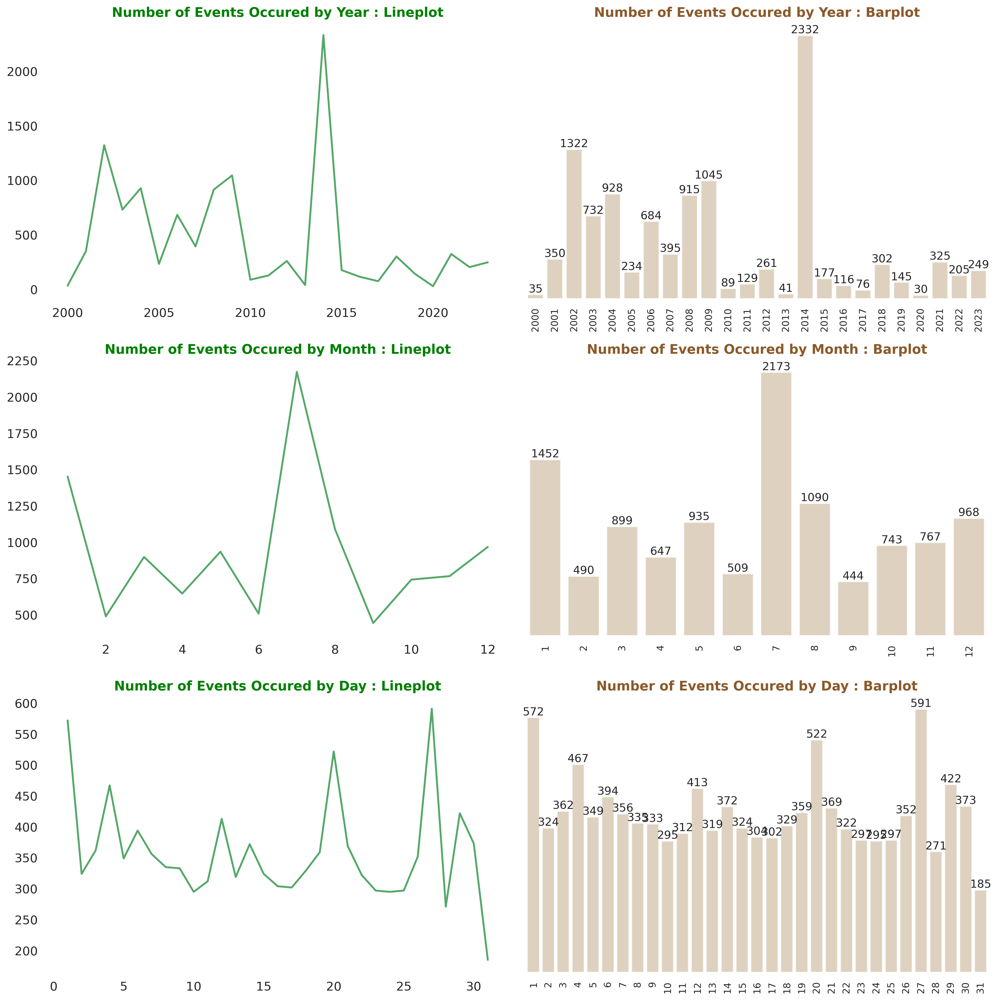

In [9]:
## Univariate Analysis
## Fatalities data by year, month, day of the month 

sns.set(rc={'axes.facecolor':'none','axes.grid':False,'xtick.labelsize':13,'ytick.labelsize':13, 'figure.autolayout':True, 'figure.dpi':300, 'savefig.dpi':300})
my_col = ('#40E0D0', '#D2B48C','#c7e9b4', '#EEE8AA','#00FFFF','#FAEBD7','#FF6347', '#FAFAD2', '#E0EEEE', '#C1CDCD', '#838B8B', '#D8BFD8','#F4A460','#F08080', '#EE82EE', '#4682B4','#6A5ACD', '#00C78C', '#FFB6C1', '#8B5F65')

plt.figure(figsize=(15,15))

plt.subplot(321)
plt.title('Number of Events Occured by Year : Lineplot', color='green', weight='bold', fontsize = 14)
sns.lineplot(df['e_year'].value_counts().sort_values(), color='g', linewidth = 2)
plt.ylabel(None), plt.xlabel(None)

plt.subplot(322)
plt.title('Number of Events Occured by Year : Barplot', color='#8B5A2B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['e_year'], color='#D2B48C', alpha=0.6)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 0.1), ha='center', va='bottom')
plt.ylabel(None), plt.yticks([]), plt.xticks(fontsize=10, rotation=90), plt.xlabel(None)

plt.subplot(323)
plt.title('Number of Events Occured by Month : Lineplot', color='green', weight='bold', fontsize = 14)
sns.lineplot(df['e_month'].value_counts().sort_values(), color='g', linewidth = 2)
plt.ylabel(None), plt.xlabel(None)

plt.subplot(324)
plt.title('Number of Events Occured by Month : Barplot', color='#8B5A2B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['e_month'], color='#D2B48C', alpha=0.6)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 0.1), ha='center', va='bottom')
plt.ylabel(None), plt.yticks([]), plt.xticks(fontsize=10, rotation=90), plt.xlabel(None)

plt.subplot(325)
plt.title('Number of Events Occured by Day : Lineplot', color='green', weight='bold', fontsize = 14)
sns.lineplot(df['e_day'].value_counts().sort_values(), color='g', linewidth = 2)
plt.ylabel(None), plt.xlabel(None)

plt.subplot(326)
plt.title('Number of Events Occured by Day : Barplot', color='#8B5A2B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['e_day'], color='#D2B48C', alpha=0.6)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 0.1), ha='center', va='bottom')
plt.ylabel(None), plt.yticks([]), plt.xticks(fontsize=10, rotation=90), plt.xlabel(None)

plt.show()

**Some Observations**

- As you can see, several fatalities happened during the year 2014. 
- Google search tells you that it is because of 2014 Gaza War, which occurred during the months of July and August.

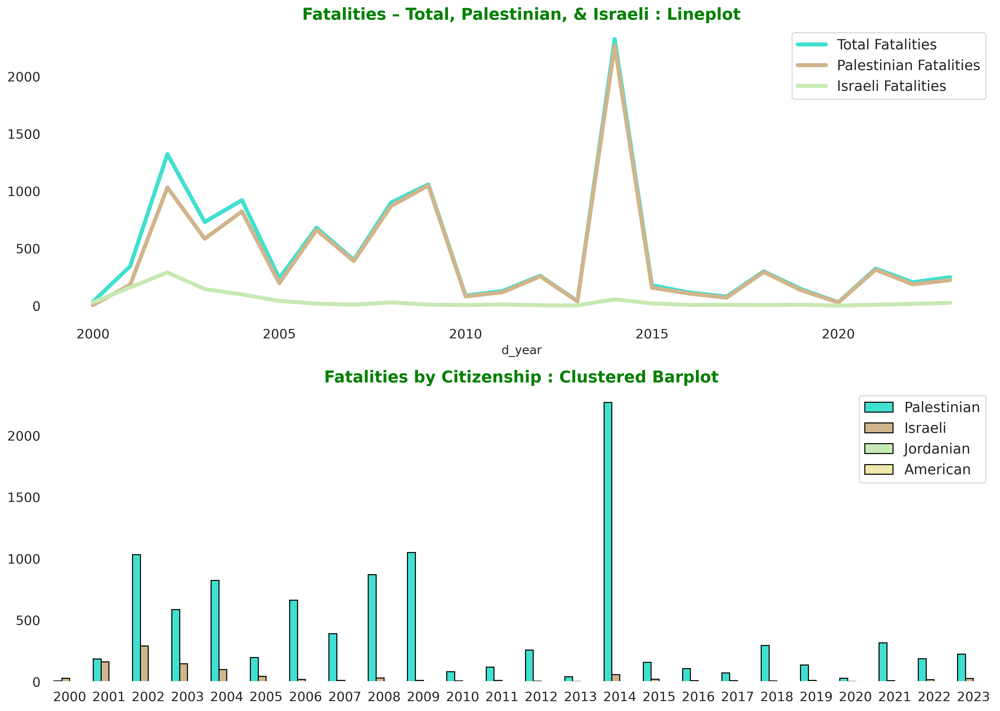

In [10]:
## Bivariate Analysis
## Fatalities data by year & citizenship

plt.subplots(figsize=(14,10))

plt.subplot(211)
plt.title('Fatalities – Total, Palestinian, & Israeli : Lineplot', color='green', weight='bold', fontsize = 16)
df['d_year'].value_counts()[df.d_year.unique()].plot(kind='line', label= 'Total Fatalities', color = '#40E0D0', alpha=1, linewidth=4)
df['d_year'][df['citizenship'] == 'Palestinian'].value_counts()[df.d_year.unique()].plot(kind='line', label= 'Palestinian Fatalities', color = '#D2B48C', alpha=1, linewidth=4)
df['d_year'][df['citizenship'] == 'Israeli'].value_counts()[df.d_year.unique()].plot(kind='line', label= 'Israeli Fatalities', color = '#c7e9b4', alpha=1, linewidth=4)
plt.legend(loc='upper right', fontsize=14)

plt.subplot(212)
plt.title('Fatalities by Citizenship : Clustered Barplot', color='green', weight='bold', fontsize = 16)
sns.countplot(x=df['d_year'], hue=df['citizenship'], palette=my_col, edgecolor = "black", saturation=1)
plt.legend(loc='upper right', fontsize=14)
plt.xlabel(None), plt.ylabel(None)

plt.show()

**Some Observations**

- From the graphs, it is understood that Palestinian fatalities are far more higher than Israeli fatalities. 
- Although, Palestinian fatalities are way higher, fatalities on Israeli side remain prevalent throughout all the years, in smaller numbers.

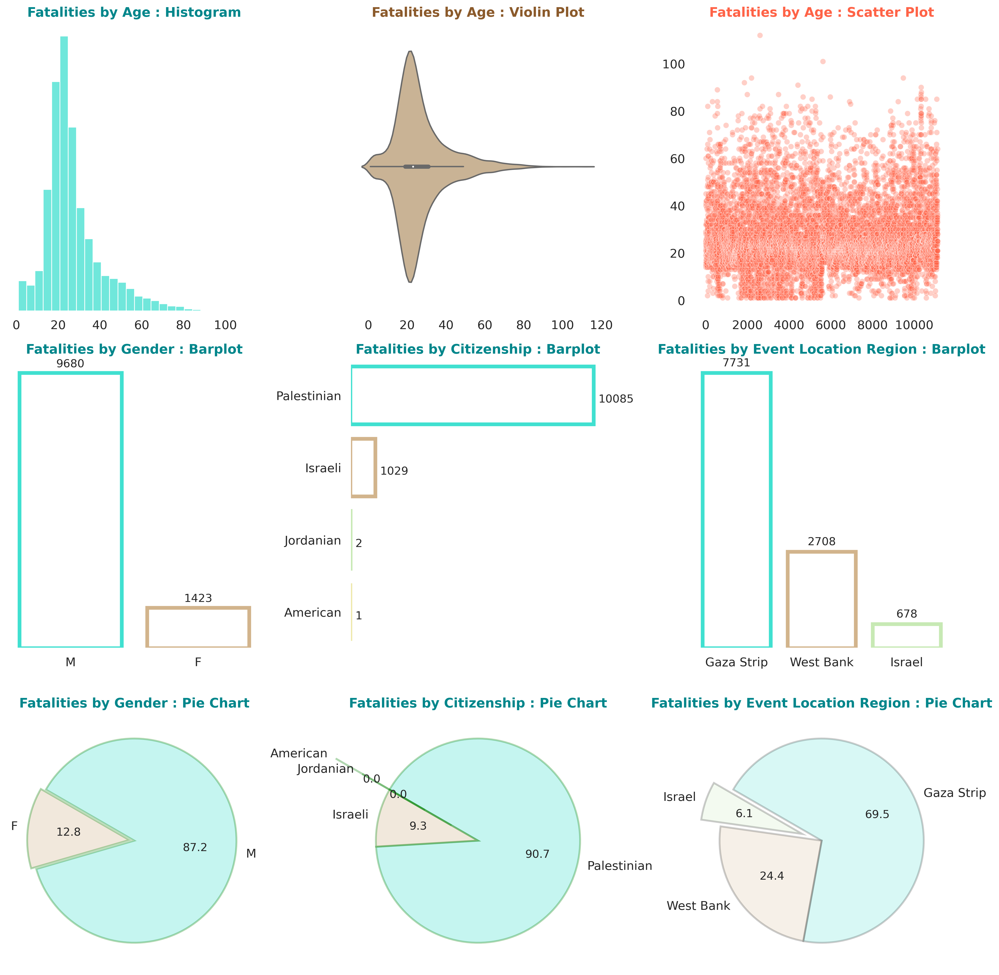

In [11]:
## Univariate Analysis
## Fatalities by Age
## Fatalities by Region
## Fatalities by Gender
## Fatalities by Citizenship

plt.subplots(figsize=(15,20))

plt.subplot(431)
plt.title('Fatalities by Age : Histogram', color='#00868B', weight='bold', fontsize=14)
sns.histplot(df['age'], color="#40E0D0", bins=28, stat='count')
plt.yticks([]), plt.ylabel(None), plt.xlabel(None)

plt.subplot(432)
plt.title('Fatalities by Age : Violin Plot', color='#8B5A2B', weight='bold', fontsize=14)
sns.violinplot(df['age'], color="#D2B48C", orient='h')
plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(433)
plt.title('Fatalities by Age : Scatter Plot', color='#FF6347', weight='bold', fontsize=14)
sns.scatterplot(df['age'], color="#FF6347", alpha=0.3)
plt.xlabel(None), plt.ylabel(None)

plt.subplot(434)
plt.title('Fatalities by Gender : Barplot', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['gender'], facecolor=(1,1,1,1), linewidth=4, edgecolor=sns.color_palette(my_col, 20), order=df['gender'].value_counts().index)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 120), ha='center', va='bottom')
plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(435)
plt.title('Fatalities by Citizenship : Barplot', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(y=df['citizenship'], facecolor=(1,1,1,1), linewidth=4, edgecolor=sns.color_palette(my_col, 20), order=df['citizenship'].value_counts().index)

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_width()),  (p.get_x() + p.get_width() + 200, p.get_y()+0.5))
plt.ylabel(None), plt.xlabel(None), plt.xticks([])

plt.subplot(436)
plt.title('Fatalities by Event Location Region : Barplot', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['event_location_region'], facecolor=(1,1,1,1), linewidth=4, edgecolor=sns.color_palette(my_col, 20), order=df['event_location_region'].value_counts().index)
for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 120), ha='center', va='bottom')
plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(437)
plt.title('Fatalities by Gender : Pie Chart', color='#00868B', weight='bold', fontsize=14)
my_xpl = [0.0, 0.05]
df['gender'].value_counts().plot(kind='pie', colors=my_col, explode=my_xpl, legend=None, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.3, 'edgecolor' : 'green','linewidth': 2, 'antialiased': True}, autopct='%1.1f')

plt.subplot(438)
plt.title('Fatalities by Citizenship : Pie Chart', color='#00868B', weight='bold', fontsize=14)
my_xpl = [0.0, 0.0, 0.3, 0.6]
df['citizenship'].value_counts().plot(kind='pie', colors=my_col, explode=my_xpl, legend=None, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.3, 'edgecolor' : 'green', 'linewidth': 2, 'antialiased': True}, autopct='%1.1f')

plt.subplot(439)
my_xpl = [0.0, 0.0, 0.20]
plt.title('Fatalities by Event Location Region : Pie Chart', color='#00868B', weight='bold', fontsize=14)
df['event_location_region'].value_counts().plot(kind='pie', colors=my_col, legend=None, explode=my_xpl, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.2, 'edgecolor' : 'black','linewidth': 2, 'antialiased': True}, autopct='%1.1f')

plt.show()

**Some Observations**

- By age, people in the ages from late teens to late 20s are among the highest in numbers, in overall fatalities volume.
- In particular, fatalities of people in the ages 18-24 is highest.
- By gender, men have died more, representing about 87% of overall fatalities.
- By citizenship, more Palestinians have died, accounting for around 91% of all fatalities.
- By Event Location, Gaza Strip has highest number of fatalities, followed by West Bank. 

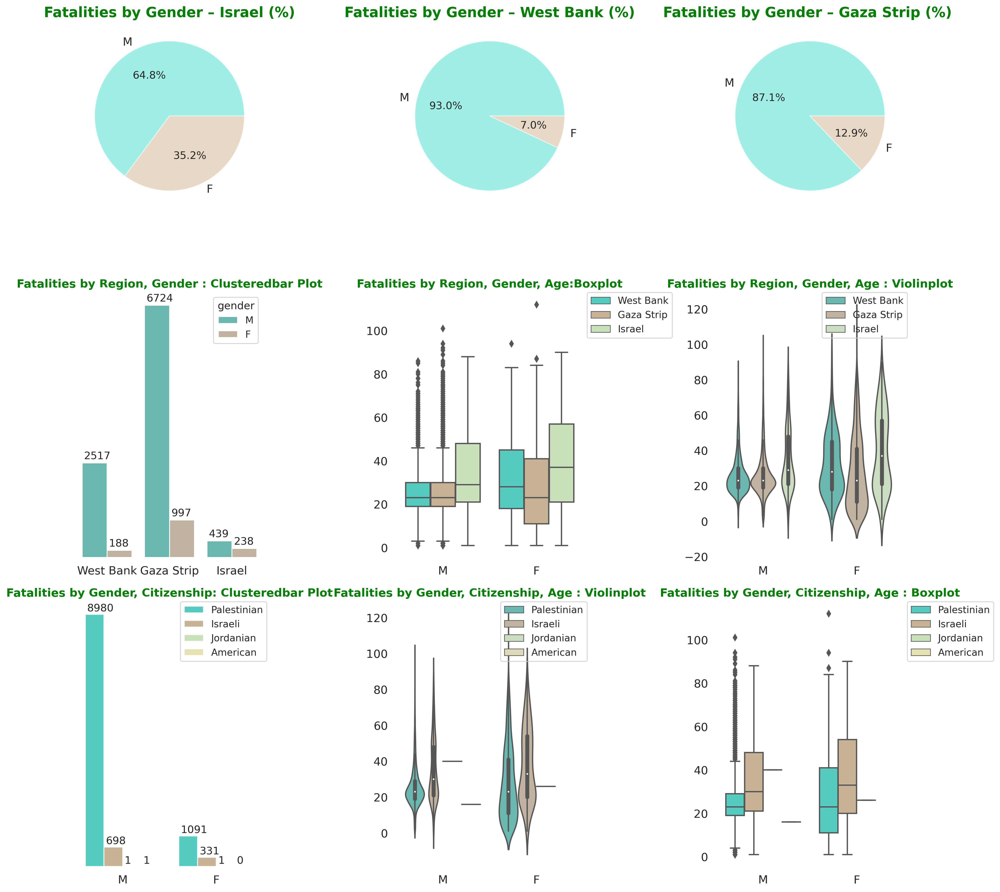

In [12]:
## Bivariate & Multivariate Analysis
## Fatalities by Age, Region, Citizenship, & Gender

plt.subplots(figsize=(15,15))

plt.subplot(331)
plt.title('Fatalities by Gender – Israel (%)', color='green', weight='bold', fontsize=16)
df[df['event_location_region'] == 'Israel']['gender'].value_counts().plot(kind='pie', subplots=True, colors = my_col, legend=None, ylabel='', wedgeprops= {"alpha": 0.5}, autopct='%1.1f%%')

plt.subplot(332)
plt.title('Fatalities by Gender – West Bank (%)', color='green', weight='bold', fontsize=16)
df[df['event_location_region'] == 'West Bank']['gender'].value_counts().plot(kind='pie', subplots=True, colors = my_col, legend=None, ylabel='', wedgeprops= {"alpha": 0.5}, autopct='%1.1f%%')

plt.subplot(333)
plt.title('Fatalities by Gender – Gaza Strip (%) ', color='green', weight='bold', fontsize=16)
df[df['event_location_region'] == 'Gaza Strip']['gender'].value_counts().plot(kind='pie', subplots=True, colors = my_col, legend=None, ylabel='', wedgeprops= {"alpha": 0.5}, autopct='%1.1f%%')

plt.subplot(334)
plt.title('Fatalities by Region, Gender : Clusteredbar Plot', color='green', weight='bold', fontsize=13)
ax = sns.countplot(x=df['event_location_region'], hue=df['gender'], palette=my_col, saturation=0.5)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.03, p.get_height()+100))
plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(335)

plt.title('Fatalities by Region, Gender, Age:Boxplot', color='green', weight='bold', fontsize=13)
sns.boxplot(x=df['gender'], y=df['age'], hue=df['event_location_region'], palette=my_col)
plt.legend(bbox_to_anchor=(1.02, 1), loc='best', borderaxespad=0)
plt.xlabel(None), plt.ylabel(None)


plt.subplot(336)
plt.title('Fatalities by Region, Gender, Age : Violinplot', color='green', weight='bold', fontsize=13)
sns.violinplot(x=df['gender'], y=df['age'], hue=df['event_location_region'], palette=my_col, saturation=0.5)
plt.legend(bbox_to_anchor=(1.02, 1), loc='best', borderaxespad=0)
plt.xlabel(None), plt.ylabel(None)

plt.subplot(337)
plt.title('Fatalities by Gender, Citizenship: Clusteredbar Plot', color='green', weight='bold', fontsize=13)
ax = sns.countplot(x=df['gender'], hue=df['citizenship'], palette=my_col)

for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.02, p.get_height()+100))

plt.legend(bbox_to_anchor=(1.02, 1), loc='best', borderaxespad=0)
plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(338)
plt.title('Fatalities by Gender, Citizenship, Age : Violinplot', color='green', weight='bold', fontsize=13)
sns.violinplot(x=df['gender'], y=df['age'], hue=df['citizenship'], palette=my_col, saturation=0.5)
plt.legend(bbox_to_anchor=(1.02, 1), loc='best', borderaxespad=0)
plt.xlabel(None), plt.ylabel(None)

plt.subplot(339)
plt.title('Fatalities by Gender, Citizenship, Age : Boxplot', color='green', weight='bold', fontsize=13)
sns.boxplot(x=df['gender'], y=df['age'], hue=df['citizenship'], palette=my_col)
plt.legend(bbox_to_anchor=(1.02, 1), loc='best', borderaxespad=0)
plt.xlabel(None), plt.ylabel(None)

plt.show()

**Some Observations**

- Women fatalities in Israel is peculiarly higher than women fatalities in Gaza Strip and West Bank.
- Mean age of Israeli fatalities is typically higher than Palestinians, in both men and women's categories.

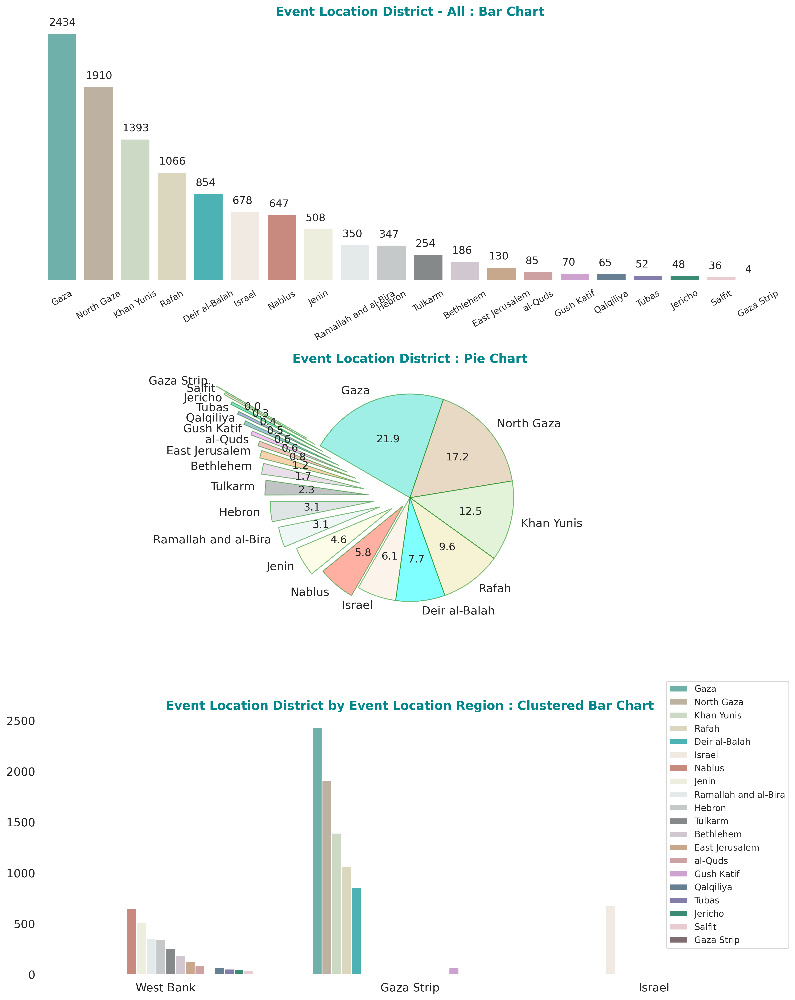

In [13]:
## Analysis by "Event Location District" & "Event Location Region"
plt.figure(figsize=(13,16))

plt.subplot(311)
plt.title('Event Location District - All : Bar Chart', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['event_location_district'], palette=my_col, saturation=0.4, order=df['event_location_district'].value_counts().index)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.05, p.get_height()+75))

plt.ylabel(None), plt.xlabel(None), plt.yticks([]), plt.xticks(rotation=30, fontsize=10)

plt.subplot(312)
my_xpl = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.10, 0.20, 0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05, 1.15]
plt.title('Event Location District : Pie Chart', color='#00868B', weight='bold', fontsize=14)
df['event_location_district'].value_counts().plot(kind='pie', colors=my_col, legend=None, explode=my_xpl, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.5, 'edgecolor' : 'green','linewidth': 1, 'antialiased': True}, autopct='%1.1f')

plt.subplot(313)
plt.title('Event Location District by Event Location Region : Clustered Bar Chart', color='#00868B', weight='bold', fontsize=14)
sns.countplot(x=df['event_location_region'], hue=df['event_location_district'], palette= my_col, saturation=0.4, hue_order=df['event_location_district'].value_counts().index)
plt.legend(bbox_to_anchor=(0.85, 0.1), loc='best', borderaxespad=0, fontsize=10)
plt.ylabel(None), plt.xlabel(None)

plt.show()

**Some Observations**

- Gaza is the most affected Event Location District, with nearly 22% share of total fatalities.
- North Gaza, Khan Yunis, Rafah, and Dier al-Balah, are other major affected districts. 

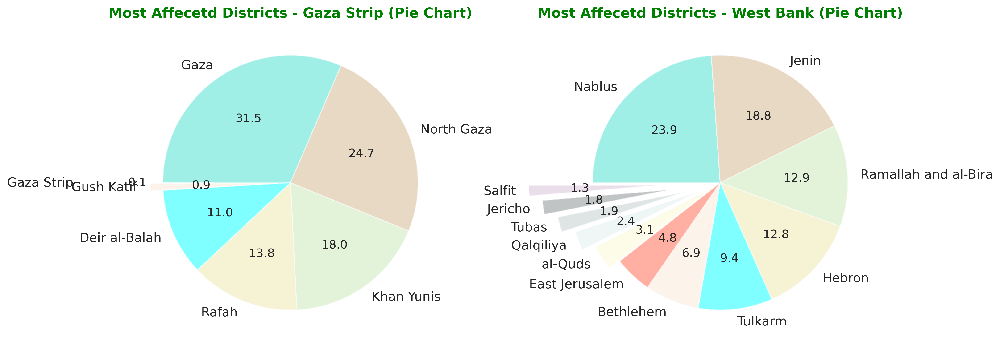

In [14]:
## Gaza Strip & West Bank have most affecetd districts
## Let's visialise these two regions, individually
plt.figure(figsize=(14,6))

plt.subplot(121)
my_xpl = [0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.6]
plt.title('Most Affecetd Districts - Gaza Strip (Pie Chart)', color='green', weight='bold', fontsize=14)
df[df['event_location_region'] == 'Gaza Strip']['event_location_district'].value_counts().plot.pie(colors = my_col, explode=my_xpl, subplots=True, legend=None, ylabel='', counterclock=False, startangle=180, wedgeprops= {"alpha": 0.5}, autopct='%1.1f')

plt.subplot(122)
my_xpl = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
plt.title('Most Affecetd Districts - West Bank (Pie Chart)', color='green', weight='bold', fontsize=14)
df[df['event_location_region'] == 'West Bank']['event_location_district'].value_counts().plot.pie(colors = my_col, explode=my_xpl, subplots=True, legend=None, ylabel='', counterclock=False, startangle=180, wedgeprops= {"alpha": 0.5}, autopct='%1.1f')

plt.show()

**Some Observations**

- **In the Gaza Strip, Gaza and North Gaza** have the highest number of fatalities, with over 55% share of total fatalities.
- Khan Yunis, Rafah and Deir al-Balah are other most affected districts in the Gaza Strip.
- **In the West Bank, Nablus and Jenin** are the most affected district.
- Ramallah and al-Bira, Hebron, Tulkarm, and Bethlehem are other most affected districts in the West Bank.

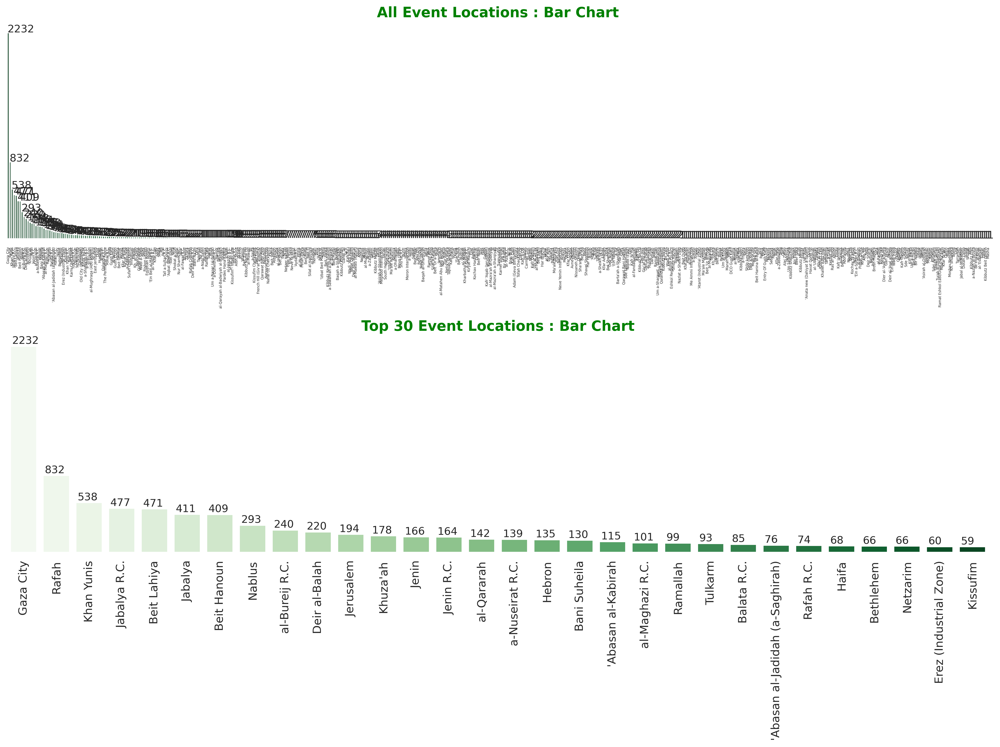

In [15]:
## Analysis by Event Location

plt.subplots(figsize=(16,12))

plt.subplot(211)
plt.title('All Event Locations : Bar Chart', color='green', weight='bold', fontsize=16)
ax = sns.countplot(x=df['event_location'], palette='Greens_r', alpha=1, order=df['event_location'].value_counts().index)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.05, p.get_height()+3))
plt.xticks(rotation=90), plt.xlabel(None), plt.ylabel(None), plt.yticks([]), plt.xticks(fontsize=4)

plt.subplot(212)
plt.title('Top 30 Event Locations : Bar Chart', color='green', weight='bold', fontsize=16)
ax = sns.countplot(x=df['event_location'], palette='Greens', alpha=1, order=df['event_location'].value_counts().head(30).index)

for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.05, p.get_height()+25))
plt.xticks(rotation=90), plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.show()

**Some Observations**

- Gaza city is the most affected Event location. Most number of fatalities have taken place there.
- Rafah, Khan Yunis, Jabalya R.C., and Beit Lahiya are other event locations.

In [16]:
## Let's do fatalities analysis by Type of Injury, Ammunition, Killed By, Whether Took Part in Hostilities
## First we will check the segment count in each feature to streamline, if needed
print('\n', 'type_of_injury', '\n','-'*40,'\n', df['type_of_injury'].value_counts())
print('\n','ammunition','\n','-'*40,'\n', df['ammunition'].value_counts())
print('\n','killed_by','\n','-'*40,'\n', df['killed_by'].value_counts())
print('\n','took_part_in_the_hostilities','\n','-'*40,'\n', df['took_part_in_the_hostilities'].value_counts())


 type_of_injury 
 ---------------------------------------- 
 type_of_injury
gunfire                         9843
explosion                        555
shelling                         311
stabbing                          48
house demolition                  25
hit by a vehicle                  18
beating                            9
stones throwing                    6
being bludgeoned with an axe       4
fire                               4
physically assaulted               2
physical assault                   1
Strangulation                      1
Name: count, dtype: int64

 ammunition 
 ---------------------------------------- 
 ammunition
missile                        2877
live ammunition                1514
shell                           675
explosive belt                  326
bomb                            249
mortar fire                      51
knife                            37
flechette shells                 22
rubber-coated metal bullets      19
0.22-caliber bullets   

In [17]:
## We will club the smaller segments in "type_of_injury" & "ammunition" varibles into a new "Others" segment
df['type_of_injury'].replace(['stabbing', 'house demolition','hit by a vehicle', 'beating', 'stones throwing', 'being bludgeoned with an axe', 'fire', 'physically assaulted', 'physical assault', 'Strangulation'], 'Other_Inju', inplace=True, regex=True)
df['type_of_injury'].replace(['gunOther_Inju'], 'gunfire', inplace=True, regex=True)
print('\n', 'Revised Type of Injury feature', '\n','-'*40,'\n', df['type_of_injury'].value_counts())

## Now we will check how these features have been transformed
df['ammunition'].replace(['mortar fire', 'knife', 'flechette shells', 'rubber-coated metal bullets', '0.22-caliber bullets', 'phosphorus shell', 'Qassam rocket', 'car bomb', 'teargas canister', 'rocket', 'grad rocket', 'sponge rounds', 'grenade', 'flare bomb', 'stun grenade', 'rock'], 'Other_Ammu', inplace=True, regex=True)
df['ammunition'].replace(['grad Other_Ammu', 'stun Other_Ammu'], 'Other_Ammu', inplace=True, regex=True)
print('\n', 'Revised Ammunition feature', '\n','-'*40, '\n', df['ammunition'].value_counts())


 Revised Type of Injury feature 
 ---------------------------------------- 
 type_of_injury
gunfire       9843
explosion      555
shelling       311
Other_Inju     118
Name: count, dtype: int64

 Revised Ammunition feature 
 ---------------------------------------- 
 ammunition
missile            2877
live ammunition    1514
shell               675
explosive belt      326
bomb                249
Other_Ammu          230
Name: count, dtype: int64


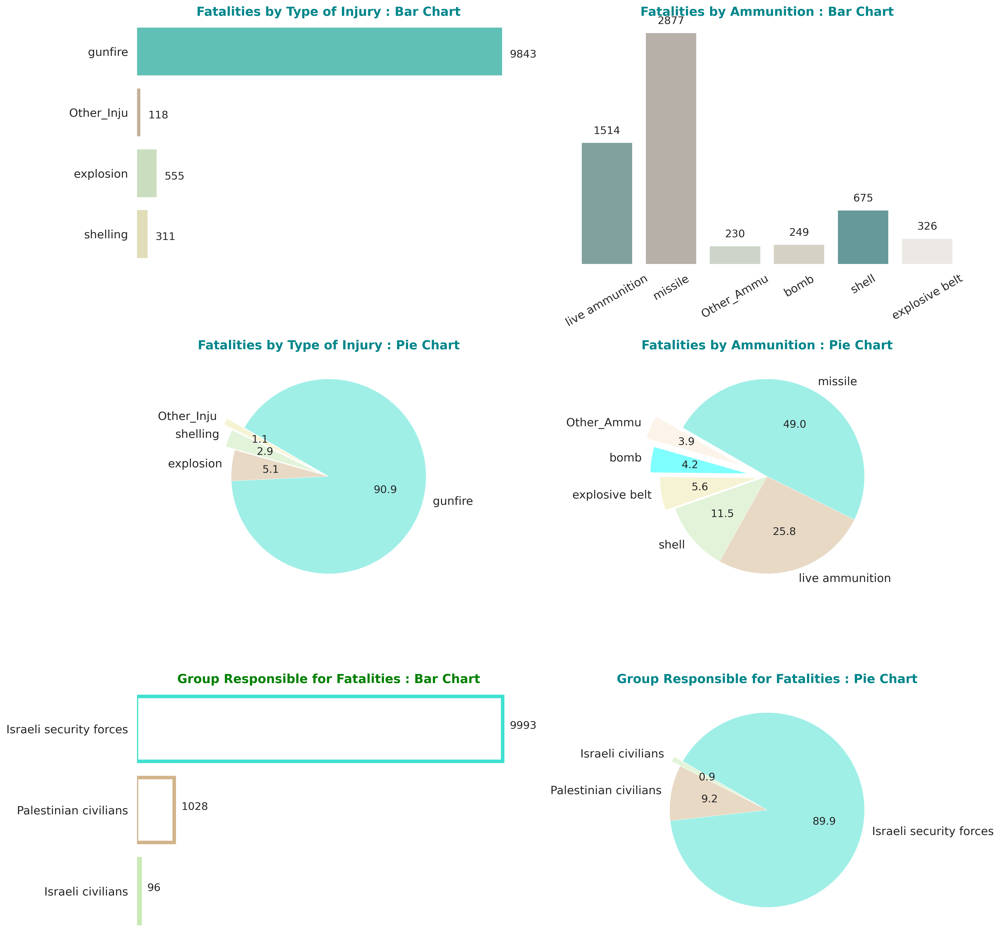

In [18]:
## Univariate Analysis
## Type of Injury, Ammunition, Group Responsible for Fatalities

plt.subplots(figsize=(16,15))

plt.subplot(321)
plt.title('Fatalities by Type of Injury : Bar Chart', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(y=df['type_of_injury'], palette=my_col, saturation=0.6)

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_width()),  (p.get_x() + p.get_width() + 200, p.get_y()+0.5))
plt.ylabel(None), plt.xlabel(None), plt.xticks([])

plt.subplot(322)
plt.title('Fatalities by Ammunition : Bar Chart', color='#00868B', weight='bold', fontsize=14)
ax = sns.countplot(x=df['ammunition'], palette=my_col, saturation=0.2)
for p in ax.patches: 
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 80), ha='center', va='bottom')
plt.xticks(rotation=30), plt.xlabel(None), plt.ylabel(None), plt.yticks([])

plt.subplot(323)
plt.title('Fatalities by Type of Injury : Pie Chart', color='#00868B', weight='bold', fontsize=14)
my_xpl = [0.0, 0.0, 0.1, 0.20]
df['type_of_injury'].value_counts().plot(kind='pie', colors=my_col, explode=my_xpl, legend=None, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.5, 'edgecolor' : 'white','linewidth': 0.5, 'antialiased': True}, autopct='%1.1f')

plt.subplot(324)
plt.title('Fatalities by Ammunition : Pie Chart', color='#00868B', weight='bold', fontsize=14)
my_xpl = [0.0, 0.0, 0.0, 0.1, 0.2, 0.3]
df['ammunition'].value_counts().plot(kind='pie', colors=my_col, explode=my_xpl, legend=None, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.5, 'edgecolor' : 'white','linewidth': 0.5, 'antialiased': True}, autopct='%1.1f')

plt.subplot(325)
plt.title('Group Responsible for Fatalities : Bar Chart', color='green', weight='bold', fontsize=14)
ax = sns.countplot(y=df['killed_by'], facecolor=(1,1,1,1), linewidth=4, edgecolor=sns.color_palette(my_col, 20), order=df['killed_by'].value_counts().index)

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_width()),  (p.get_x() + p.get_width() + 200, p.get_y()+0.4))
plt.ylabel(None), plt.xlabel(None), plt.xticks([])

plt.subplot(326)
plt.title('Group Responsible for Fatalities : Pie Chart', color='#00868B', weight='bold', fontsize=14)
my_xpl = [0.0, 0.0, 0.1]
df['killed_by'].value_counts().plot(kind='pie', colors=my_col, explode=my_xpl, legend=None, ylabel='', counterclock=False, startangle=150, wedgeprops={'alpha':0.5, 'edgecolor' : 'white','linewidth': 0.5, 'antialiased': True}, autopct='%1.1f')

plt.show()

**Some Observations**

- Gunfire is the cause of most number of fatalities.
- Missiles category is leading ammunition type, followed by live ammunition, and shelling.

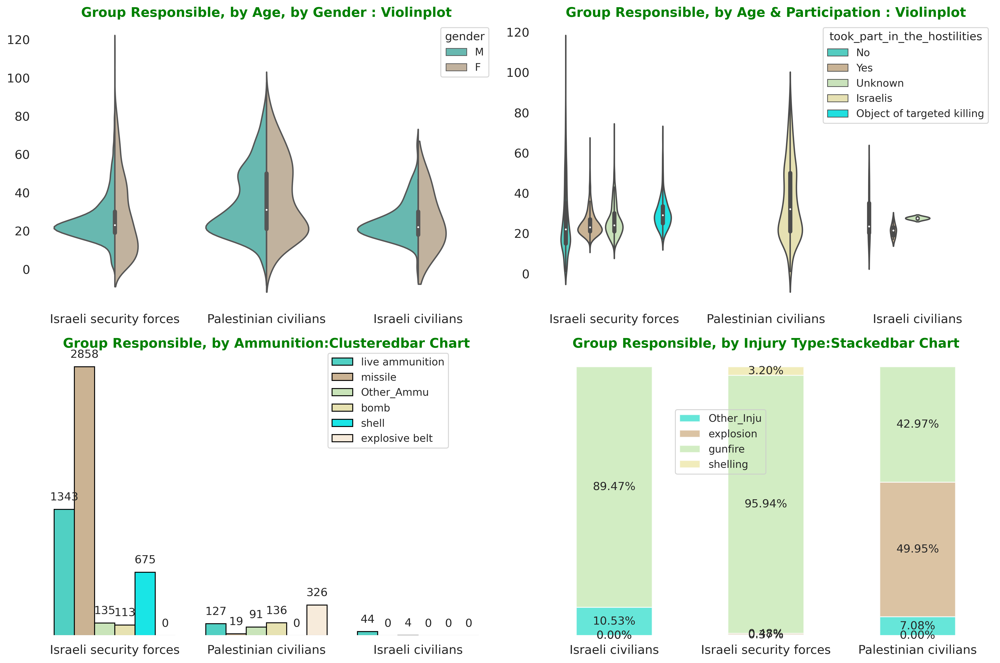

In [19]:
## Multivariate Analysis
## Group Responsible for Fatalities, Age, Gender, Type of Injury, Ammunition, Participation

plt.subplots(figsize=(15,10))

plt.subplot(221)
plt.title('Group Responsible, by Age, by Gender : Violinplot', color='green', weight='bold', fontsize=14)
sns.violinplot(x=df['killed_by'], y=df['age'], hue=df['gender'], palette=my_col, split=True, gap=.1, saturation=0.5)

plt.xlabel(None), plt.ylabel(None)

plt.subplot(222)
plt.title('Group Responsible, by Age & Participation : Violinplot', color='green', weight='bold', fontsize=14)
sns.violinplot(x=df['killed_by'], y=df['age'], hue=df['took_part_in_the_hostilities'], palette=my_col)

plt.xlabel(None), plt.ylabel(None)

plt.subplot(223)
plt.title('Group Responsible, by Ammunition:Clusteredbar Chart', color='green', weight='bold', fontsize=14)
ax = sns.countplot(x=df['killed_by'], hue=df['ammunition'], palette=my_col, edgecolor = "black", saturation=0.8)
for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+ p.get_width()/2, p.get_height() + 70), ha='center', va='bottom')
ax.set_xlabel(None), ax.set_ylabel(None), ax.set_yticks([])
plt.legend(bbox_to_anchor=(0.9, 1), loc='best', borderaxespad=0)

ax = plt.subplot(224)
plt.title('Group Responsible, by Injury Type:Stackedbar Chart', color='green', weight='bold', fontsize=14)
ax = pd.crosstab(df['killed_by'], df['type_of_injury'], normalize = "index").plot.bar(stacked=True, color=my_col, alpha=0.8, ax=ax)

for c in ax.containers:
    ax.bar_label(c, fmt='{:.2%}', label_type='center')
ax.set_xlabel(None), ax.set_ylabel(None), ax.set_yticks([]), plt.xticks(rotation = 0)
plt.legend(bbox_to_anchor=(0.5, 0.8), loc='best', borderaxespad=0)

plt.show()

**Some Observations**
 
 - A majority of Israeli civilians (89%) and Israeli security forces (96%) were killed by gunfire.
 - Whereas, narly 50% of Palestinian fatalities were due to explosion, and 43% were due to gunfire.

In [20]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [21]:
import folium
from folium import plugins

In [22]:
## Generate a heat map of event location districts with Folium library
## Define latitude and longitude for the Event location districts in our dataset
## Note: Collected the Lat-Long coordinates manually from website : https://www.gps-coordinates.net/

lat_longs = [
    [31.5050311,34.4641381], #Gaza
    [31.5501268,34.5033134], #North Gaza
    [31.3457612,34.3025277], #Khan Yunis
    [31.2752047,34.2558269], #Rafah
    [31.4183455,34.3502476], #Deir al-Balah
    [31.89096313966111,37.850288931736976], #Israel
    [32.2205316,35.2569374], #Nablus
    [32.4618837,35.297566], #Jenin
    [31.9106212,35.2088129], #Ramallah and al-Bira
    [31.5304303,35.0879406], #Hebron
    [32.3111468,35.0275505], #Tulkarm
    [31.7043556,35.2061876], #Bethlehem
    [31.78336,35.23388], #East Jerusalem
    [31.8912806,35.2003213], #al-Quds
    [31.42507,34.3734], #Gush Katif
    [32.18966,34.97063], #Qalqiliya
    [32.3234392,35.3693661], #Tubas
    [31.855991,35.4598851], #Jericho
    [32.0851611,35.1815442], #Salfit
]

## Setup event location district heat map with folium
event_location_district_heat_map = folium.Map(location= [31.90, 34.80], zoom_start=8)

## Add lat_longs data to folium event location district heat map
event_location_district_heat_map.add_child(plugins.HeatMap(lat_longs, min_opacity=0.6, radius=18))

## Display heat map
event_location_district_heat_map

- By looking at the heat map, you can figure out that Gaza (at the lower left corner) and West bank (on north eastern part of Israel) have highest number of events.

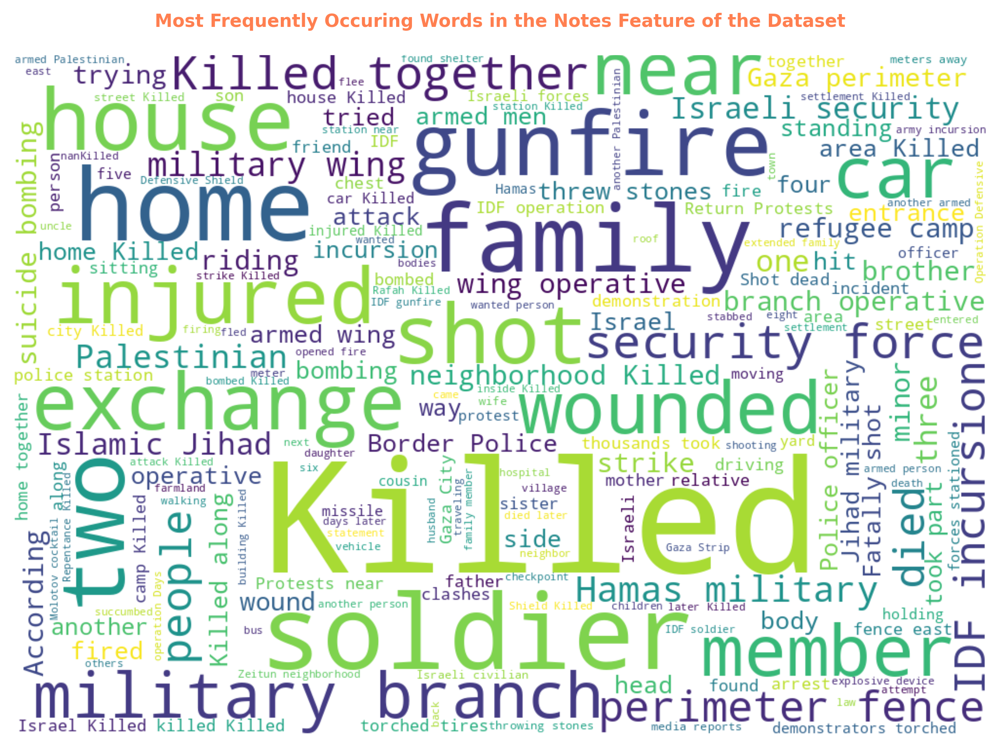

In [23]:
## Let's take a look at Word Cloud plot of the "notes" feature (the last column)
## Word Cloud lets us know which words occured most number of times in a particular dataset

## Import WordCloud module from wordcloud library
from wordcloud import WordCloud

## Set comment words
cloud_of_words = ''.join(df['notes'].astype(str))

## Generate a Word Cloud
facecolor = 'white'
wordcloud = WordCloud(width=1000, height=700,background_color=facecolor, 
            min_font_size=10, max_font_size=160).generate(cloud_of_words)

## Plot the World Cloud image
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.xticks([]), plt.yticks([])
plt.title('Most Frequently Occuring Words in the Notes Feature of the Dataset', color='coral', weight='bold', fontsize=10, pad=15)
plt.show()

<p style="float:right; font-family:Calibri (Body); color:black; font-size:14px;" > <br>Here we conclude our notebook.... <br> <br>I hope you will find the notebook relevant and useful.... <br> <br>Please do share your opinions, thoughts and feedback (if any) in the comments section.... <br> <br><b>THANK YOU<b>...... <br>